# WFI2033 data_visullization multimass

读取 WFI2033 multimass HMC 结果并可视化：
- Trace plot
- Corner plot
- Data / Model / Residual / Source（含 source-plane AGN 位置）
- Lens-light-subtracted data 保存


In [1]:
import os
os.environ.setdefault("HDF5_USE_FILE_LOCKING", "FALSE")

import warnings
warnings.filterwarnings("ignore")

from pathlib import Path
import sys

import arviz as az
import corner
import jax
import jax.numpy as jnp
import matplotlib.pyplot as plt
from matplotlib import colors
import numpy as np
import numpyro
import xarray as xr
from tqdm.auto import tqdm
from astropy.io import fits

jax.config.update("jax_enable_x64", True)
numpyro.enable_x64()

# Ensure local WFI2033 modules are importable
if str(Path.cwd()) not in sys.path:
    sys.path.append(str(Path.cwd()))

from herculens_import_main import (
    get_pixel_grid,
    trace_current_agn_to_source,
    params2kwargs_EPL_w_shear,
    params2kwargs_SIS,
    params2kwargs_multi_gauss_light,
)
from herculens.Instrument.noise import Noise
from herculens.Instrument.psf import PSF
from herculens.MassModel.mass_model import MassModel
from herculens.LightModel.light_model import LightModel
from herculens.PointSourceModel.point_source_model import PointSourceModel
from lens_images_extension import LensImageExtension, pixelize_plane as pixelize_plane_single
from herculens.Util import model_util


[CudaDevice(id=0)]


In [2]:
suffix = '_ss=2_full_light_multimass'
OUTPUT_ROOT = Path('/mnt/lustre/tianli/quasar_hmc')


In [3]:
DATA_DIR = Path('../../Data/WFI2033')
RAW_DATA_PATH = DATA_DIR / 'jw01198-o004_t004_nircam_clear-f115w_i2d.fits'
MASK_PATH = 'data/mask_hmc.fits'
MASK_OUT_PATH = DATA_DIR / 'mask_out_center.fits'

run_tag = '20260401_11'
RUN_OUTPUT_DIR = OUTPUT_ROOT / f'WFI2033{suffix}_{run_tag}'
if not RUN_OUTPUT_DIR.exists():
    raise FileNotFoundError(f'Missing run directory: {RUN_OUTPUT_DIR}')
products_root = Path('./result') / f'result{suffix}_{run_tag}'
products_dir = products_root / 'data_products'
NC_PATH = RUN_OUTPUT_DIR / f'WFI2033_all{suffix}.nc'
HMC_MEDIAN_PATH = products_root / f'HMC_median_draw{suffix}.nc'

print('RUN_OUTPUT_DIR =', RUN_OUTPUT_DIR)
print('products_dir =', products_dir)
print('HMC_MEDIAN_PATH =', HMC_MEDIAN_PATH)

with fits.open(RAW_DATA_PATH, memmap=True) as hdul_raw:
    raw_header = hdul_raw['SCI'].header if 'SCI' in hdul_raw else hdul_raw[0].header
    exposure_time = float(raw_header.get('EXPTIME', raw_header.get('TEXPTIME', raw_header.get('XPOSURE', 1.0))))
pix_scale = float(np.sqrt(raw_header['PIXAR_A2']))

data = np.array(fits.getdata(products_dir / f'data_bkg_sub{suffix}.fits'), dtype=float)
rms_file = np.array(fits.getdata(products_dir / f'rms_with_psf_extra{suffix}.fits'), dtype=float)
fixed_first_three = np.load(products_dir / f'fixed_first_three_gaussians{suffix}.npz')
fixed_first_three_psf = np.array(fits.getdata(products_dir / f'fixed_first_three_psf{suffix}.fits'), dtype=float)
psf_base = np.array(fits.getdata(products_dir / f'psf_base{suffix}.fits'), dtype=float)
mask = np.array(fits.getdata(MASK_PATH), dtype=bool)
mask_out = np.array(fits.getdata(MASK_OUT_PATH), dtype=bool)
mask = mask_out.copy()

ny, nx = mask_out.shape
xc, yc = nx / 2, ny / 2
r = 16

y, x = jnp.indices((ny, nx))
circle = (x - xc) ** 2 + (y - yc) ** 2 <= r ** 2
mask_out = jnp.logical_or(mask_out, circle)

valid = jnp.isfinite(data) & jnp.isfinite(rms_file) & (rms_file > 0)
mask = mask & valid

fixed_first_three_psf = np.clip(fixed_first_three_psf, 0.0, None)
fixed_first_three_psf = fixed_first_three_psf / np.sum(fixed_first_three_psf)
psf_base = np.clip(psf_base, 0.0, None)
psf_base = psf_base / np.sum(psf_base)
fixed_kwargs_lens_light_first_three = [{
    'amp': np.asarray(fixed_first_three['amp'], dtype=float),
    'sigma': np.asarray(fixed_first_three['sigma'], dtype=float),
    'e1': np.asarray(fixed_first_three['e1'], dtype=float),
    'e2': np.asarray(fixed_first_three['e2'], dtype=float),
    'center_x': np.asarray(fixed_first_three['center_x'], dtype=float),
    'center_y': np.asarray(fixed_first_three['center_y'], dtype=float),
}]

inf_data_pixel = az.from_netcdf(str(NC_PATH))
post = inf_data_pixel.posterior
HMC_median = xr.load_dataset(HMC_MEDIAN_PATH)
num_chains = int(post.sizes['chain'])
source_grid_scale = 0.8

conj_points = jnp.array([
    [1.20212170716053, -0.12271885209256231],
    [0.9053233071260114, 0.5277189685977776],
    [-1.0461673774453952, 1.0081083299749878],
    [-0.1255456241215261, -0.8965524340129204],
])

G1_MASS_CENTER = (1.556, 1.299)
G2_MASS_CENTER = (2.145, -3.326)
G3_MASS_CENTER = (4.243403, 6.185564)
G7_MASS_CENTER = (-7.284665, -10.319681)

pixel_grid, xgrid, ygrid, x_axis, y_axis, extent, nx, ny = get_pixel_grid(jnp.array(data), pix_scale)


RUN_OUTPUT_DIR = /mnt/lustre/tianli/quasar_hmc/WFI2033_ss=2_full_light_multimass_20260401_11
products_dir = result/result_ss=2_full_light_multimass_20260401_11/data_products
HMC_MEDIAN_PATH = result/result_ss=2_full_light_multimass_20260401_11/HMC_median_draw_ss=2_full_light_multimass.nc


In [4]:
# Build LensImage object (pixelated source) for forward model visualization
noise = Noise(nx, ny, exposure_time=exposure_time)
psf_obj = PSF(psf_type='PIXEL', kernel_point_source=psf_base)

mass_model_pixel = MassModel(['EPL', 'SHEAR', 'SIS', 'SIS', 'SIS', 'SIS'])
lens_light_model_pixel = LightModel(['MULTI_GAUSSIAN_ELLIPSE'], {})

pixel_grid_shape = int(post['pixels_source_grid'].shape[-1])

source_light_model_pixel = LightModel(
    ['PIXELATED'],
    pixel_adaptive_grid=True,
    pixel_interpol='fast_bilinear',
    kwargs_pixelated={'num_pixels': pixel_grid_shape},
)

point_source_model_pixel = PointSourceModel(
    ['IMAGE_POSITIONS'],
    mass_model=mass_model_pixel,
    image_plane=pixel_grid,
)

lens_image_pixel = LensImageExtension(
    pixel_grid,
    psf_obj,
    noise_class=noise,
    lens_light_model_class=lens_light_model_pixel,
    lens_mass_model_class=mass_model_pixel,
    source_model_class=source_light_model_pixel,
    point_source_model_class=point_source_model_pixel,
    source_arc_mask=jnp.array(mask),
    conjugate_points=conj_points,
    kwargs_numerics={'supersampling_factor': 1},
    source_grid_scale=source_grid_scale,
)


In [5]:


model_image_med = np.array(HMC_median['model_image'].values)
psf_corr_med = np.array(HMC_median['psf_kernel_corrected'].values)
psf_corr_med = np.clip(psf_corr_med, 0.0, None)
psf_corr_med = psf_corr_med / np.sum(psf_corr_med, axis=(1, 2), keepdims=True)


def _chain_param_dict(i: int):
    keys = [
        'theta_E_1', 'gamma_1', 'e_1', 'center_1', 'gamma_sheer_1',
        'theta_E_g1', 'theta_E_g2', 'theta_E_g3', 'theta_E_g7',
        'amp_lens', 'sigma_lens', 'e_lens', 'center_lens',
        'pixels_source_grid', 'ra_ps', 'dec_ps', 'log10_amp_ps',
    ]
    p = {k: np.array(HMC_median[k].isel(chain=i).values) for k in keys}

    p['center_1_g1'] = np.array([G1_MASS_CENTER[0]], dtype=float)
    p['center_2_g1'] = np.array([G1_MASS_CENTER[1]], dtype=float)
    p['center_1_g2'] = np.array([G2_MASS_CENTER[0]], dtype=float)
    p['center_2_g2'] = np.array([G2_MASS_CENTER[1]], dtype=float)
    p['center_1_g3'] = np.array([G3_MASS_CENTER[0]], dtype=float)
    p['center_2_g3'] = np.array([G3_MASS_CENTER[1]], dtype=float)
    p['center_1_g7'] = np.array([G7_MASS_CENTER[0]], dtype=float)
    p['center_2_g7'] = np.array([G7_MASS_CENTER[1]], dtype=float)
    return p


def fixed_sis_from_theta_E(theta_E, origin):
    return [{
        'theta_E': theta_E,
        'center_x': origin[0],
        'center_y': origin[1],
    }]


def params_2_kwargs(params: dict):
    theta_E_g1 = np.asarray(params['theta_E_g1']).reshape(-1)[0]
    theta_E_g2 = np.asarray(params['theta_E_g2']).reshape(-1)[0]
    theta_E_g3 = np.asarray(params['theta_E_g3'])
    theta_E_g7 = np.asarray(params['theta_E_g7'])

    kwargs_lens = (
        params2kwargs_EPL_w_shear(params, '1')
        + fixed_sis_from_theta_E(theta_E_g1, G1_MASS_CENTER)
        + fixed_sis_from_theta_E(theta_E_g2, G2_MASS_CENTER)
        + fixed_sis_from_theta_E(theta_E_g3, G3_MASS_CENTER)
        + fixed_sis_from_theta_E(theta_E_g7, G7_MASS_CENTER)
    )

    return {
        'kwargs_lens': kwargs_lens,
        'kwargs_lens_light': params2kwargs_multi_gauss_light(params, 'lens'),
        'kwargs_source': [{'pixels': np.asarray(params['pixels_source_grid'])}],
        'kwargs_point_source': [{
            'ra': np.asarray(params['ra_ps']),
            'dec': np.asarray(params['dec_ps']),
            'amp': np.power(10.0, np.asarray(params['log10_amp_ps'])),
        }],
    }


kwargs_chains = [params_2_kwargs(_chain_param_dict(i)) for i in range(num_chains)]


In [6]:
# Fermat-potential differences from posterior samples
# Loop over draw for memory control, and vmap only over the chain axis.
# Optional subsampling: if max_draws_per_chain is set, randomly draw that many samples per chain.

posterior_keys = [
    'theta_E_1', 'gamma_1', 'e_1', 'center_1', 'gamma_sheer_1',
    'theta_E_g1', 'theta_E_g2', 'theta_E_g3', 'theta_E_g7', 'ra_ps', 'dec_ps',
]
posterior_arrays_full = {k: jnp.asarray(post[k].values) for k in posterior_keys}

max_draws_per_chain = 1000
rng_subsample = np.random.default_rng(12345)

n_draws_full = int(post.sizes['draw'])
if max_draws_per_chain is None or max_draws_per_chain >= n_draws_full:
    draw_indices = np.arange(n_draws_full, dtype=int)
else:
    draw_indices = np.sort(rng_subsample.choice(n_draws_full, size=max_draws_per_chain, replace=False))

posterior_arrays = {k: v[:, draw_indices, ...] for k, v in posterior_arrays_full.items()}
post_for_fpd = post.isel(draw=draw_indices)

chain_in_axes = {k: 0 for k in posterior_keys}

def fixed_sis_from_theta_E(theta_E, origin):
    return [{
        'theta_E': theta_E,
        'center_x': origin[0],
        'center_y': origin[1],
    }]

def compute_fpd_single(params_i):
    params_i = dict(params_i)
    theta_E_g1 = params_i['theta_E_g1'][0]
    theta_E_g2 = params_i['theta_E_g2'][0]
    theta_E_g3 = params_i['theta_E_g3']
    theta_E_g7 = params_i['theta_E_g7']

    kwargs_lens_i = (
        params2kwargs_EPL_w_shear(params_i, '1')
        + fixed_sis_from_theta_E(theta_E_g1, G1_MASS_CENTER)
        + fixed_sis_from_theta_E(theta_E_g2, G2_MASS_CENTER)
        + fixed_sis_from_theta_E(theta_E_g3, G3_MASS_CENTER)
        + fixed_sis_from_theta_E(theta_E_g7, G7_MASS_CENTER)
    )
    fermat_i = mass_model_pixel.fermat_potential(
        params_i['ra_ps'],
        params_i['dec_ps'],
        kwargs_lens_i,
    )
    return jnp.array([
        fermat_i[2] - fermat_i[0],
        fermat_i[2] - fermat_i[1],
        fermat_i[2] - fermat_i[3],
    ])

compute_fpd_chain = jax.vmap(compute_fpd_single, in_axes=(chain_in_axes,))

n_draws = int(len(draw_indices))
fpd_values = np.empty((num_chains, n_draws, 3), dtype=float)
for draw_i in tqdm(range(n_draws), desc='Computing fpd_31, fpd_32, fpd_34 over draws'):
    params_draw_i = {k: posterior_arrays[k][:, draw_i, ...] for k in posterior_keys}
    fpd_values[:, draw_i, :] = np.asarray(jax.device_get(compute_fpd_chain(params_draw_i)), dtype=float)

post_with_fpd = post_for_fpd.assign(
    fpd_31=(("chain", "draw"), fpd_values[:, :, 0]),
    fpd_32=(("chain", "draw"), fpd_values[:, :, 1]),
    fpd_34=(("chain", "draw"), fpd_values[:, :, 2]),
)

print('Added posterior variables: fpd_31, fpd_32, fpd_34')
print('draw_indices shape:', draw_indices.shape)
print('fpd_values shape:', fpd_values.shape)
print('fpd_31 median by chain:', np.median(fpd_values[:, :, 0], axis=1))
print('fpd_32 median by chain:', np.median(fpd_values[:, :, 1], axis=1))
print('fpd_34 median by chain:', np.median(fpd_values[:, :, 2], axis=1))


Computing fpd_31, fpd_32, fpd_34 over draws:   0%|          | 0/1000 [00:00<?, ?it/s]

Added posterior variables: fpd_31, fpd_32, fpd_34
draw_indices shape: (1000,)
fpd_values shape: (6, 1000, 3)
fpd_31 median by chain: [-0.30794404 -0.30797565 -0.30783289 -0.30767511 -0.30772075 -0.29615083]
fpd_32 median by chain: [-0.32789127 -0.3276293  -0.32747748 -0.32751969 -0.32757963 -0.31193137]
fpd_34 median by chain: [-0.46883812 -0.46904528 -0.46899044 -0.46844841 -0.46880864 -0.46626559]


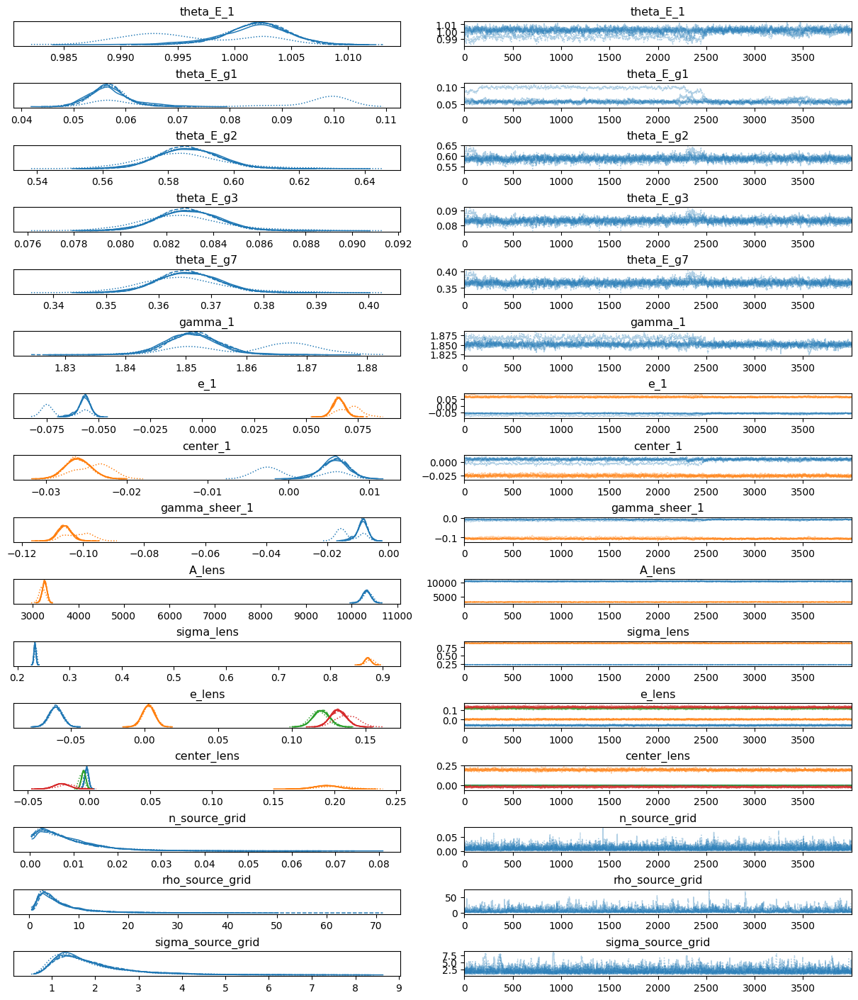

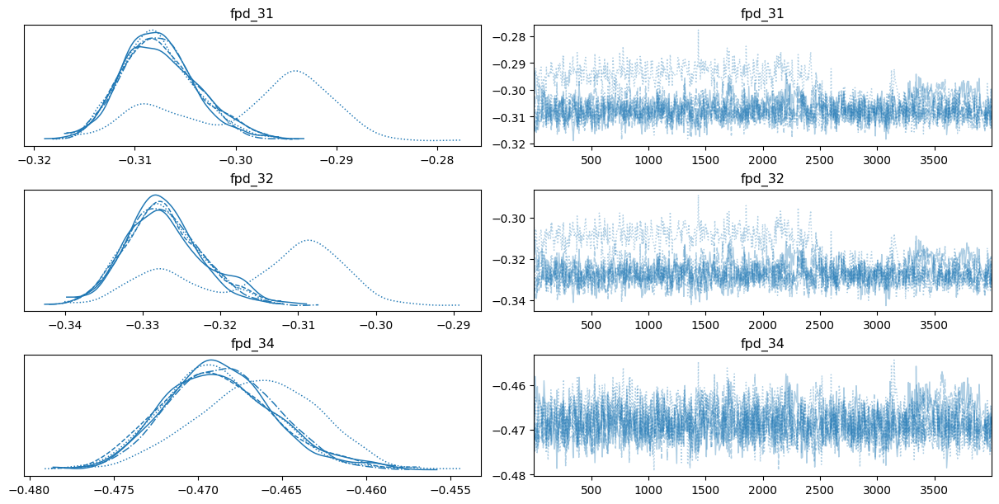

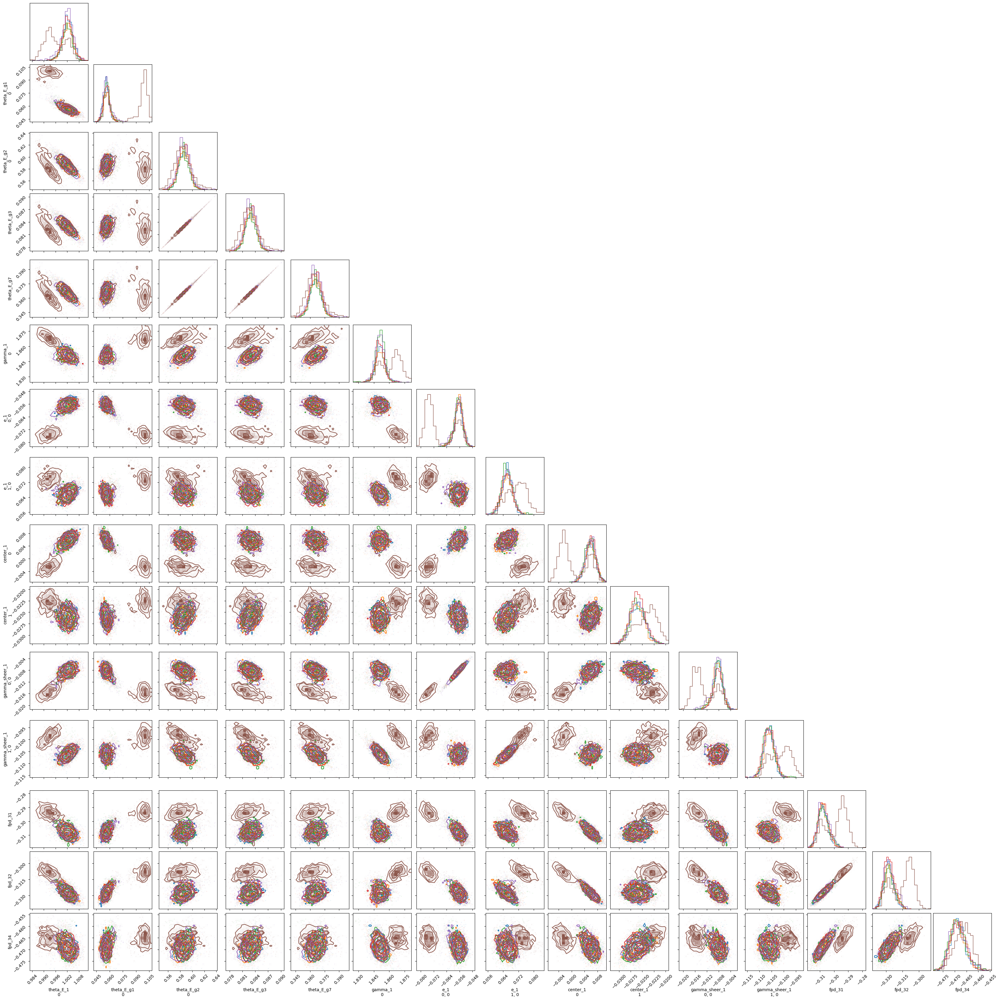

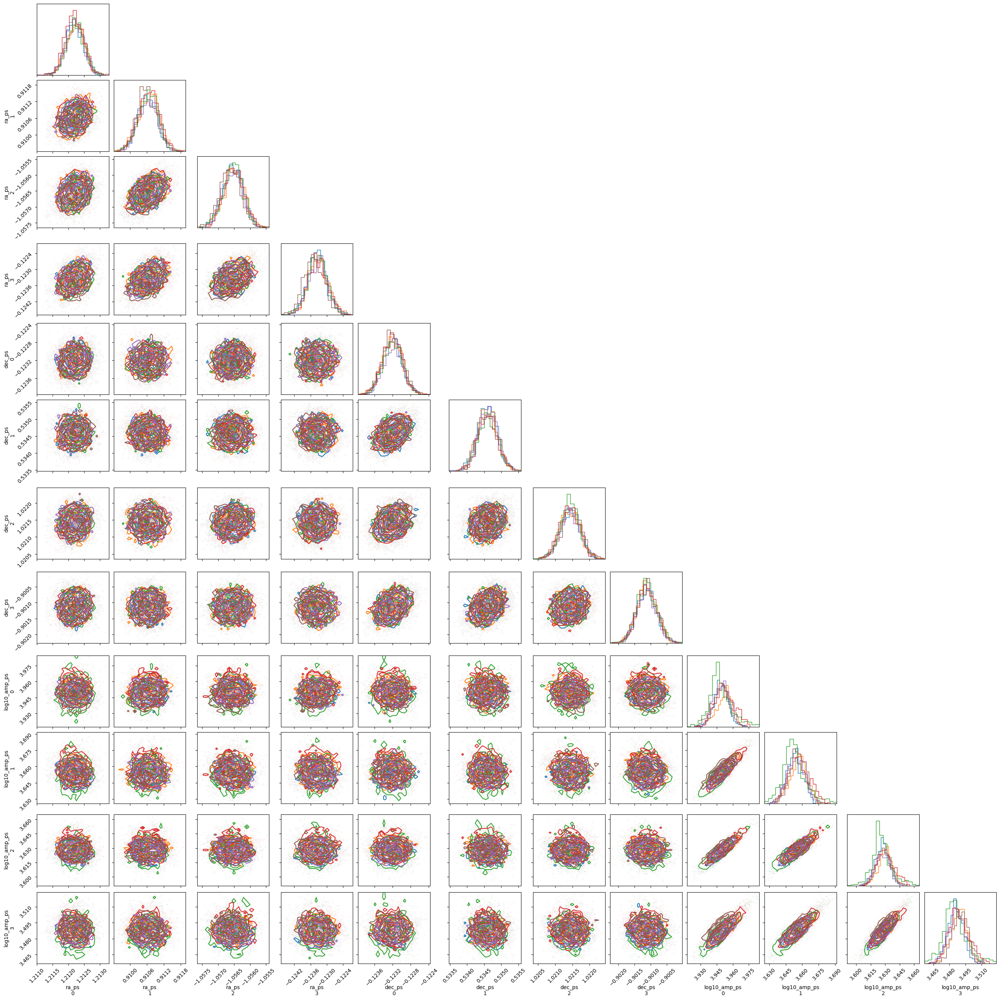

In [7]:
# Trace + corner diagnostics
vars_mass = ['theta_E_1', 'theta_E_g1', 'theta_E_g2', 'theta_E_g3', 'theta_E_g7', 'gamma_1', 'e_1', 'center_1', 'gamma_sheer_1']
vars_light = ["A_lens", "sigma_lens", "e_lens", "center_lens"]
vars_power = ['n_source_grid', 'rho_source_grid', 'sigma_source_grid']
vars_mass_corner = vars_mass + ['fpd_31', 'fpd_32', 'fpd_34']

plt.rcParams['figure.constrained_layout.use'] = True
_ = az.plot_trace(
    inf_data_pixel,
    var_names=vars_mass + vars_light + vars_power,
    figsize=(12, 14),
    divergences=True
)
plt.show()

_ = az.plot_trace(
    post_with_fpd,
    var_names=['fpd_31', 'fpd_32', 'fpd_34'],
    figsize=(12, 6),
)
plt.show()

fig_corner = None
for i in range(num_chains):
    fig_corner = corner.corner(
        post_with_fpd.isel(chain=i),
        var_names=vars_mass_corner,
        color=f'C{i}',
        fig=fig_corner,
    )
plt.show()

fig_corner = None
for i in range(num_chains):
    fig_corner = corner.corner(
        post_for_fpd.isel(chain=i),
        var_names=['ra_ps', 'dec_ps', 'log10_amp_ps'],
        color=f'C{i}',
        fig=fig_corner,
    )
plt.show()


In [8]:
div = inf_data_pixel.sample_stats['diverging']
if div.dims == ('chain', 'draw', 'diverging_dim_0'):
    div_counts = np.asarray(div.sum(dim='draw').values, dtype=int)
    print('divergences per chain:')
    print(f'  block 0 (main mass/source/lens-light/AGN): {div_counts[:, 0]}')
    print(f'  block 1 (psf correction): {div_counts[:, 1]}')
else:
    print('divergences per chain:')
    print(np.asarray(div.sum(dim='draw').values, dtype=int))

az.summary(post_with_fpd.isel(chain=list(range(num_chains))), var_names=vars_mass_corner + vars_power)


divergences per chain:
  block 0 (main mass/source/lens-light/AGN): [ 45 103  17 124 137 267]
  block 1 (psf correction): [0 0 0 0 0 0]


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
theta_E_1[0],1.001,0.004,0.992,1.007,0.001,0.001,22.0,20.0,1.19
theta_E_g1[0],0.061,0.013,0.049,0.100,0.005,0.006,19.0,14.0,1.24
theta_E_g2[0],0.586,0.010,0.566,0.605,0.000,0.001,825.0,242.0,1.02
theta_E_g3,0.083,0.001,0.080,0.086,0.000,0.000,825.0,242.0,1.02
theta_E_g7,0.365,0.006,0.353,0.377,0.000,0.000,825.0,242.0,1.02
gamma_1[0],1.853,0.007,1.841,1.869,0.002,0.002,21.0,19.0,1.20
"e_1[0, 0]",-0.059,0.006,-0.076,-0.052,0.002,0.002,20.0,15.0,1.22
"e_1[1, 0]",0.067,0.004,0.060,0.075,0.001,0.001,24.0,21.0,1.17
center_1[0],0.005,0.003,-0.003,0.009,0.001,0.001,20.0,18.0,1.21
center_1[1],-0.026,0.002,-0.029,-0.022,0.000,0.000,29.0,28.0,1.14


In [9]:
for name in ['fpd_31', 'fpd_32', 'fpd_34']:
    fpd_samples = post_with_fpd[name].isel(chain=list(range(min(num_chains, 5)))).values.flatten()
    p16, p50, p84 = np.percentile(fpd_samples, [16, 50, 84])
    err_minus = p50 - p16
    err_plus = p84 - p50
    print(f'{name} = {p50:.4f} - {err_minus:.4f} + {err_plus:.4f}')


fpd_31 = -0.3078 - 0.0033 + 0.0040
fpd_32 = -0.3276 - 0.0045 + 0.0053
fpd_34 = -0.4688 - 0.0031 + 0.0034


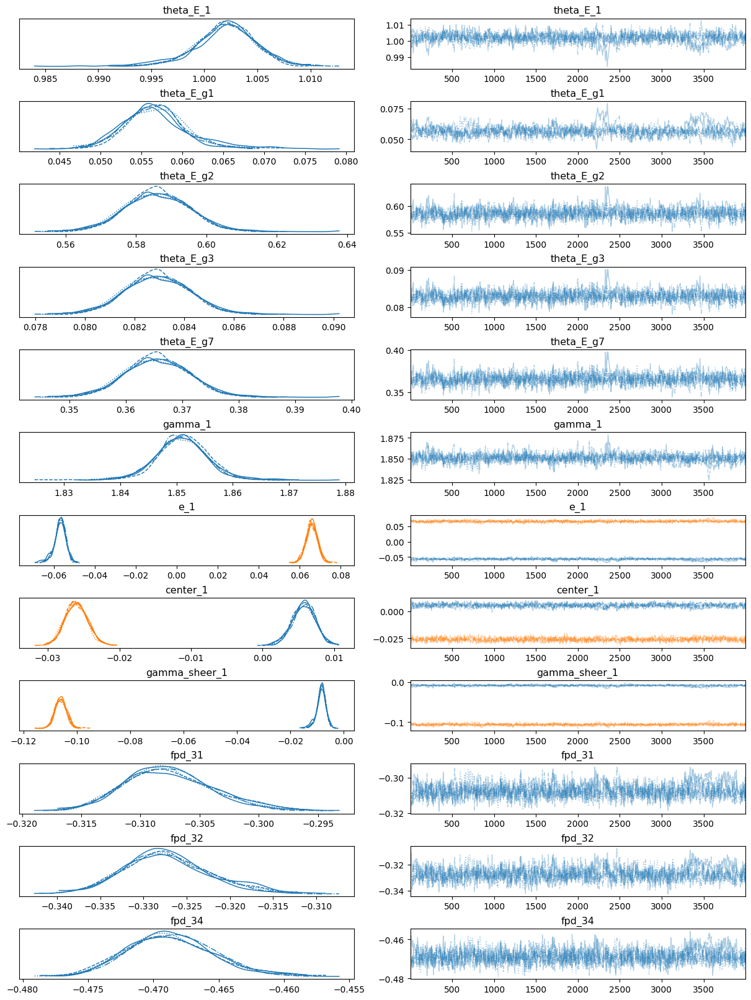

In [10]:
plt.rcParams['figure.constrained_layout.use'] = True
_ = az.plot_trace(
    post_with_fpd.isel(chain=list(range(min(num_chains, 5)))),
    var_names=vars_mass + ['fpd_31', 'fpd_32', 'fpd_34'],
    figsize=(12, 16),
)
plt.show()


In [11]:
az.summary(post_with_fpd.isel(chain=list(range(5))), var_names=vars_mass_corner + vars_power)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
theta_E_1[0],1.002,0.003,0.997,1.007,0.000,0.00,519.0,397.0,1.01
theta_E_g1[0],0.057,0.004,0.049,0.064,0.000,0.00,294.0,260.0,1.02
theta_E_g2[0],0.586,0.009,0.569,0.604,0.000,0.00,940.0,1769.0,1.00
theta_E_g3,0.083,0.001,0.080,0.085,0.000,0.00,940.0,1769.0,1.00
theta_E_g7,0.366,0.006,0.355,0.377,0.000,0.00,940.0,1769.0,1.00
gamma_1[0],1.851,0.005,1.842,1.860,0.000,0.00,637.0,745.0,1.00
"e_1[0, 0]",-0.057,0.003,-0.063,-0.052,0.000,0.00,321.0,250.0,1.01
"e_1[1, 0]",0.066,0.003,0.060,0.071,0.000,0.00,698.0,731.0,1.00
center_1[0],0.006,0.002,0.003,0.009,0.000,0.00,773.0,1089.0,1.01
center_1[1],-0.026,0.002,-0.029,-0.023,0.000,0.00,809.0,2271.0,1.01


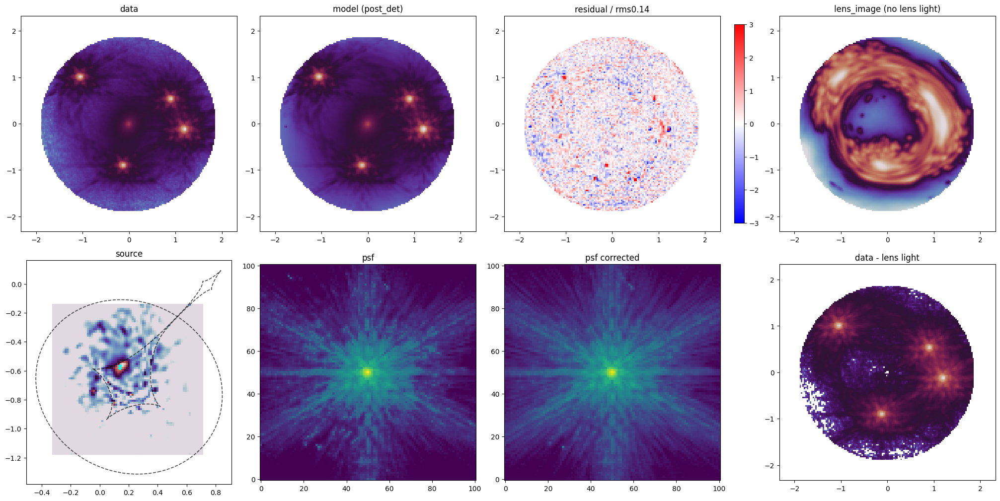

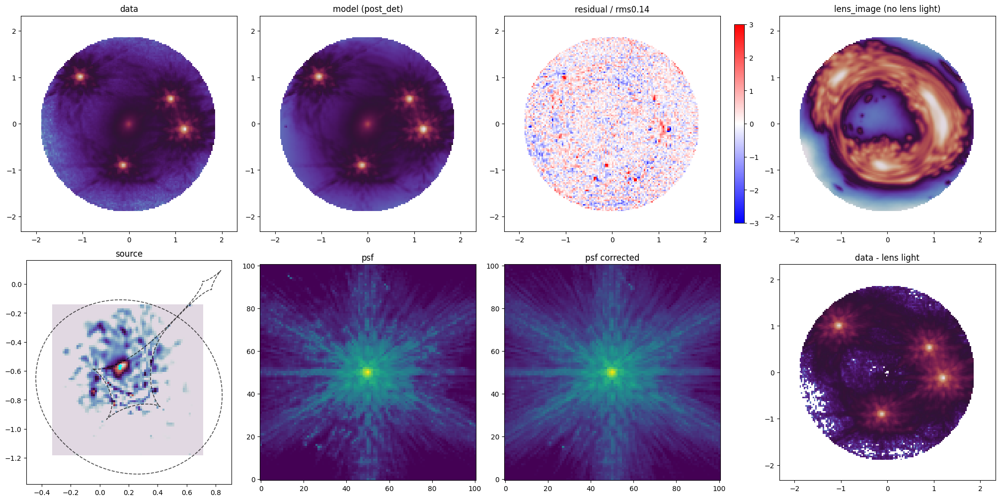

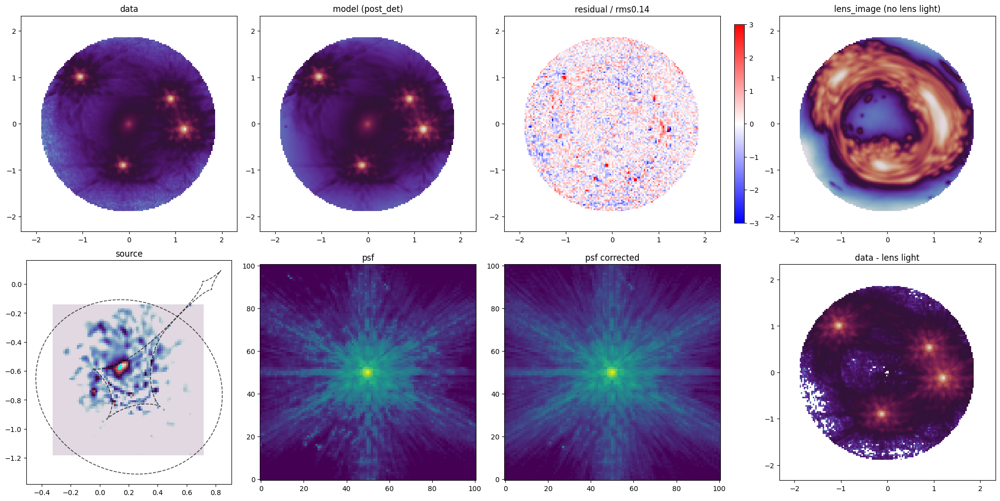

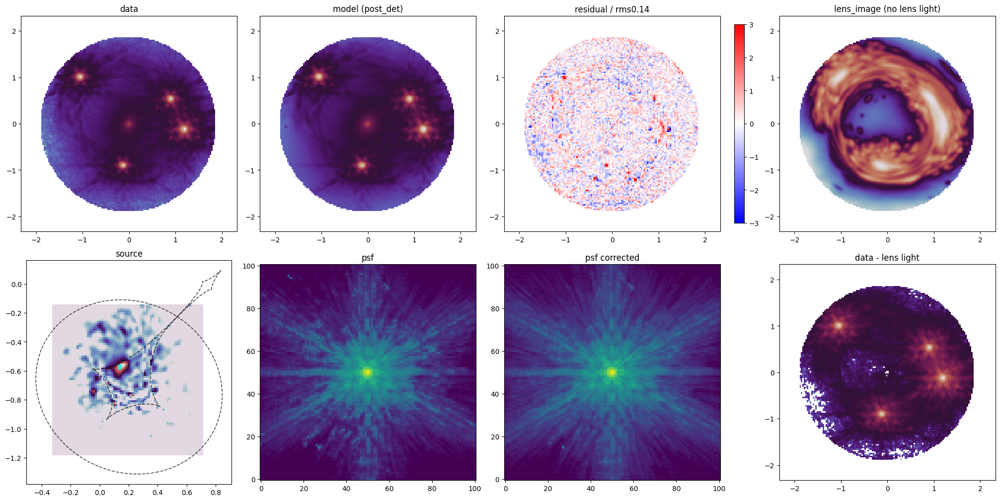

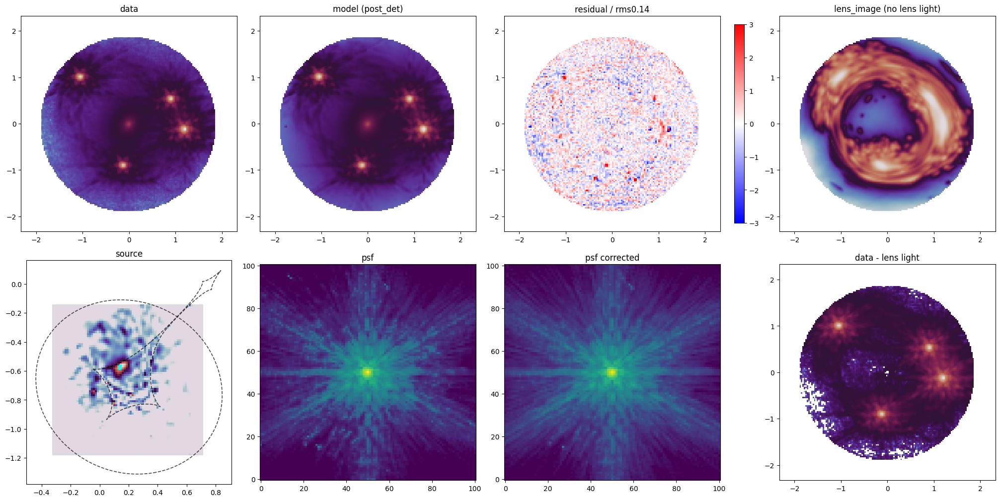

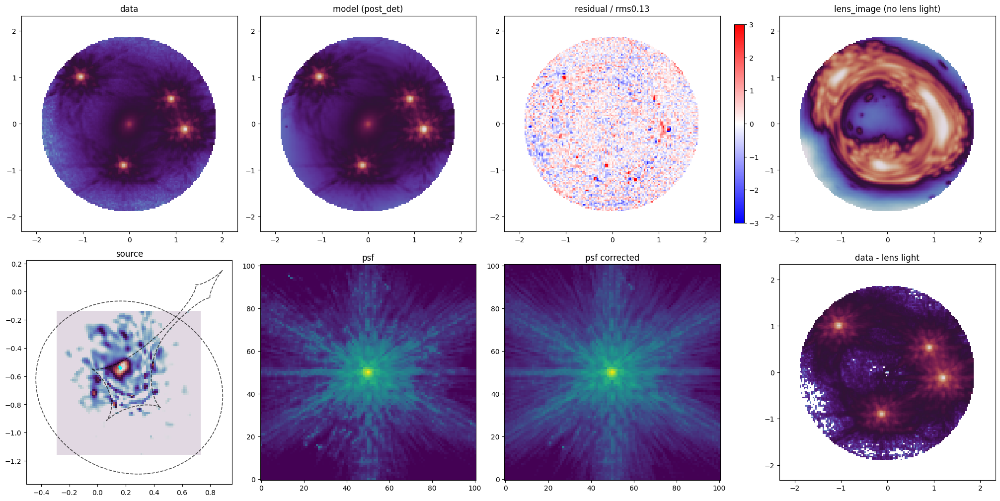

In [12]:
# Main visualization:
# row1: data | model(post_det) | residual | lens_image_pixel.model(without lens light)
# row2: source | psf | psf corrected | data - lens light
mask_plot = np.array(mask_out, dtype=bool)
rms_safe = np.array(rms_file, dtype=float)

for i in range(num_chains):
    kwargs_i = kwargs_chains[i]
    psf_corr_i = np.array(psf_corr_med[i], dtype=float)

    # Posterior deterministic model image
    model_det_i = np.array(model_image_med[i], dtype=float)
    residual_i = (data - model_det_i) / rms_safe

    # Full lens_image model without lens light (source + point source only)
    model_wo_lens_light_i = np.array(
        lens_image_pixel.model(
            **kwargs_i,
            source_add=True,
            lens_light_add=False,
            point_source_add=False,
            psf_kernel=psf_corr_i,
        )
    )

    # Lens-light-only model: fixed first three Gaussians use the saved fixed PSF,
    # while the inferred last two Gaussians use the corrected PSF from the chain median.
    fixed_lens_light_unconv = lens_image_pixel.lens_surface_brightness(
        fixed_kwargs_lens_light_first_three,
    )
    fixed_lens_light_i = np.array(
        lens_image_pixel.ImageNumerics.re_size_convolve(
            fixed_lens_light_unconv,
            unconvolved=False,
            psf_kernel=fixed_first_three_psf,
        )
    )
    free_lens_light_i = np.array(
        lens_image_pixel.model(
            **kwargs_i,
            source_add=False,
            lens_light_add=True,
            point_source_add=False,
            psf_kernel=psf_corr_i,
        )
    )
    lens_light_only_i = fixed_lens_light_i + free_lens_light_i

    source_i, source_extent = pixelize_plane_single(
        lens_image_pixel,
        kwargs_i,
        pixel_grid_shape,
    )
    src_x, src_y = trace_current_agn_to_source(lens_image_pixel, kwargs_i)
    src_x = np.array(src_x)
    src_y = np.array(src_y)

    critical_lines_i, caustics_i = model_util.critical_lines_caustics(
        lens_image_pixel,
        kwargs_i['kwargs_lens'],
        supersampling=10,
    )

    fig, ax = plt.subplots(2, 4, figsize=(20, 10))
    # fig.suptitle(f'WFI2033 posterior median visualization | chain {i}', y=0.98)

    # row 1
    ax[0, 0].imshow(np.ma.array(data, mask=~mask_plot), norm='log', cmap='twilight', origin='lower', extent=extent, vmin = 0.001)
    ax[0, 0].set_title('data')

    ax[0, 1].imshow(np.ma.array(model_det_i, mask=~mask_plot), norm='log', cmap='twilight', origin='lower', extent=extent, vmin = 0.001)
    ax[0, 1].set_title('model (post_det)')

    im_res = ax[0, 2].imshow(np.ma.array(residual_i, mask=~mask_plot), cmap='bwr', vmin=-3, vmax=3, origin='lower', extent=extent)
    ax[0, 2].set_title('residual / rms'+f"{np.mean(residual_i):.2f}")
    plt.colorbar(im_res, ax=ax[0, 2], fraction=0.046, pad=0.04)

    ax[0, 3].imshow(np.ma.array(model_wo_lens_light_i, mask=~mask_plot), norm='log', cmap='twilight', origin='lower', extent=extent)
    ax[0, 3].set_title('lens_image (no lens light)')

    # row 2
    src_abs = np.nanmax(np.abs(np.array(source_i)))
    src_norm = colors.SymLogNorm(
        linthresh=max(src_abs * 1e-3, 1e-8),
        vmin=-src_abs,
        vmax=src_abs,
    )
    ax[1, 0].imshow(np.array(source_i), cmap='twilight', origin='lower', extent=source_extent)
    for curve_x, curve_y in caustics_i:
        ax[1, 0].plot(curve_x, curve_y, color='black', linewidth=1.2, alpha = 0.7, linestyle = 'dashed')
    ax[1, 0].scatter(src_x, src_y, s=15, facecolors='cyan', marker='+', linewidths=1.6)
    ax[1, 0].set_title('source')

    eps = 1e-12
    vmax_psf = np.nanmax([np.nanmax(psf_base), np.nanmax(psf_corr_i)])
    psf_norm = colors.LogNorm(vmin=max(vmax_psf * 1e-6, eps), vmax=max(vmax_psf, eps * 10))

    ax[1, 1].imshow(np.clip(psf_base, eps, None), cmap='viridis', norm=psf_norm, origin='lower')
    ax[1, 1].set_title('psf')

    ax[1, 2].imshow(np.clip(psf_corr_i, eps, None), cmap='viridis', norm=psf_norm, origin='lower')
    ax[1, 2].set_title('psf corrected')

    ax[1, 3].imshow(np.ma.array(data - lens_light_only_i, mask=~mask_plot), norm='log', cmap='twilight', origin='lower', extent=extent)
    ax[1, 3].set_title('data - lens light')

    # for a in ax.ravel():
    #     a.set_xticks([])
    #     a.set_yticks([])

    plt.show()


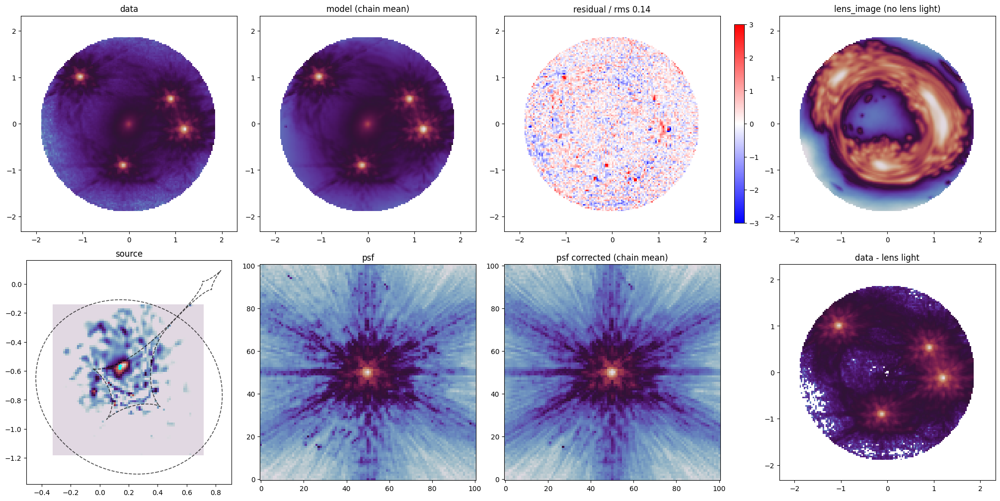

In [13]:
# Average visualization over all chains
HMC_all_chain_median = HMC_median.median(dim='chain')

model_image_avg = np.mean(model_image_med, axis=0)
psf_corr_avg = np.mean(psf_corr_med, axis=0)
psf_corr_avg = np.clip(psf_corr_avg, 0.0, None)
psf_corr_avg = psf_corr_avg / np.sum(psf_corr_avg)

params_avg = {}
for k in [
    'theta_E_1', 'gamma_1', 'e_1', 'center_1', 'gamma_sheer_1',
    'theta_E_g1', 'theta_E_g2', 'theta_E_g3', 'theta_E_g7',
    'amp_lens', 'sigma_lens', 'e_lens', 'center_lens',
    'pixels_source_grid', 'ra_ps', 'dec_ps', 'log10_amp_ps',
]:
    params_avg[k] = np.array(HMC_all_chain_median[k].values)
params_avg['center_1_g1'] = np.array([G1_MASS_CENTER[0]], dtype=float)
params_avg['center_2_g1'] = np.array([G1_MASS_CENTER[1]], dtype=float)
params_avg['center_1_g2'] = np.array([G2_MASS_CENTER[0]], dtype=float)
params_avg['center_2_g2'] = np.array([G2_MASS_CENTER[1]], dtype=float)
params_avg['center_1_g3'] = np.array([G3_MASS_CENTER[0]], dtype=float)
params_avg['center_2_g3'] = np.array([G3_MASS_CENTER[1]], dtype=float)
params_avg['center_1_g7'] = np.array([G7_MASS_CENTER[0]], dtype=float)
params_avg['center_2_g7'] = np.array([G7_MASS_CENTER[1]], dtype=float)
kwargs_avg = params_2_kwargs(params_avg)

residual_avg = (data - model_image_avg) / rms_safe

model_wo_lens_light_avg = np.array(
    lens_image_pixel.model(
        **kwargs_avg,
        source_add=True,
        lens_light_add=False,
        point_source_add=False,
        psf_kernel=psf_corr_avg,
    )
)

fixed_lens_light_unconv = lens_image_pixel.lens_surface_brightness(
    fixed_kwargs_lens_light_first_three,
)
fixed_lens_light_avg = np.array(
    lens_image_pixel.ImageNumerics.re_size_convolve(
        fixed_lens_light_unconv,
        unconvolved=False,
        psf_kernel=fixed_first_three_psf,
    )
)
free_lens_light_avg = np.array(
    lens_image_pixel.model(
        **kwargs_avg,
        source_add=False,
        lens_light_add=True,
        point_source_add=False,
        psf_kernel=psf_corr_avg,
    )
)
lens_light_avg = fixed_lens_light_avg + free_lens_light_avg

source_avg, source_extent = pixelize_plane_single(
    lens_image_pixel,
    kwargs_avg,
    pixel_grid_shape,
)
src_x_avg, src_y_avg = trace_current_agn_to_source(lens_image_pixel, kwargs_avg)
src_x_avg = np.array(src_x_avg)
src_y_avg = np.array(src_y_avg)
critical_lines_avg, caustics_avg = model_util.critical_lines_caustics(
    lens_image_pixel,
    kwargs_avg['kwargs_lens'],
    supersampling=10,
)

fig, ax = plt.subplots(2, 4, figsize=(20, 10))

ax[0, 0].imshow(np.ma.array(data, mask=~mask_plot), norm='log', cmap='twilight', origin='lower', extent=extent, vmin=0.001)
ax[0, 0].set_title('data')

ax[0, 1].imshow(np.ma.array(model_image_avg, mask=~mask_plot), norm='log', cmap='twilight', origin='lower', extent=extent, vmin=0.001)
ax[0, 1].set_title('model (chain mean)')

im_res = ax[0, 2].imshow(np.ma.array(residual_avg, mask=~mask_plot), cmap='bwr', vmin=-3, vmax=3, origin='lower', extent=extent)
ax[0, 2].set_title(f'residual / rms {np.mean(residual_avg):.2f}')
plt.colorbar(im_res, ax=ax[0, 2], fraction=0.046, pad=0.04)

ax[0, 3].imshow(np.ma.array(model_wo_lens_light_avg, mask=~mask_plot), norm='log', cmap='twilight', origin='lower', extent=extent)
ax[0, 3].set_title('lens_image (no lens light)')

ax[1, 0].imshow(np.array(source_avg), cmap='twilight', origin='lower', extent=source_extent)
for curve_x, curve_y in caustics_avg:
    ax[1, 0].plot(curve_x, curve_y, color='black', linewidth=1.2, alpha=0.7, linestyle='dashed')
ax[1, 0].scatter(src_x_avg, src_y_avg, s=15, facecolors='cyan', marker='+', linewidths=1.6)
ax[1, 0].set_title('source')

eps = 1e-12
vmax_psf = np.nanmax([np.nanmax(psf_base), np.nanmax(psf_corr_avg)])
psf_norm = colors.LogNorm(vmin=max(vmax_psf * 1e-6, eps), vmax=max(vmax_psf, eps * 10))

ax[1, 1].imshow(psf_base, cmap='twilight', norm='log', origin='lower')
ax[1, 1].set_title('psf')

ax[1, 2].imshow(psf_corr_avg, cmap='twilight', norm='log', origin='lower')
ax[1, 2].set_title('psf corrected (chain mean)')

ax[1, 3].imshow(np.ma.array(data - lens_light_avg, mask=~mask_plot), norm='log', cmap='twilight', origin='lower', extent=extent)
ax[1, 3].set_title('data - lens light')

plt.show()


## Save lens-light-subtracted data


In [14]:
SAVE_DIR = products_root
SAVE_DIR.mkdir(parents=True, exist_ok=True)

lens_light_subtracted_data = np.array(data - lens_light_avg, dtype=np.float32)
lens_light_subtracted_path = SAVE_DIR / f'data_minus_lens_light{suffix}.fits'
fits.writeto(lens_light_subtracted_path, lens_light_subtracted_data, overwrite=True)
print('Saved lens-light-subtracted data to:', lens_light_subtracted_path)


Saved lens-light-subtracted data to: result/result_ss=2_full_light_multimass_20260401_11/data_minus_lens_light_ss=2_full_light_multimass.fits


## Preview saved lens-light-subtracted data


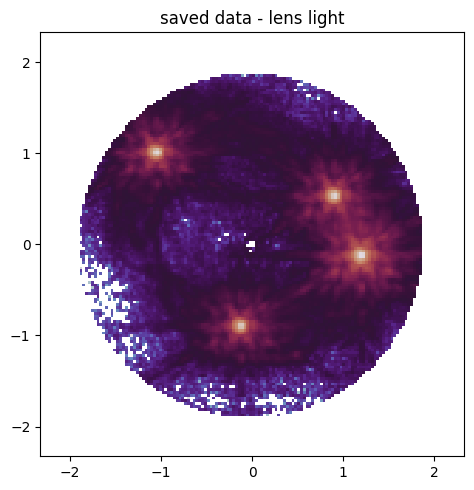

Lens-light-subtracted FITS path: result/result_ss=2_full_light_multimass_20260401_11/data_minus_lens_light_ss=2_full_light_multimass.fits


In [15]:
fig, ax = plt.subplots(1, 1, figsize=(6, 5))
ax.imshow(
    np.ma.array(lens_light_subtracted_data, mask=~mask_plot),
    norm='log',
    cmap='twilight',
    origin='lower',
    extent=extent,
)
ax.set_title('saved data - lens light')
plt.tight_layout()
plt.show()

print('Lens-light-subtracted FITS path:', lens_light_subtracted_path)


In [1]:
import herculens

In [2]:
print(herculens.__file__)

/mnt/lustre2/shared_conda/envs/tianli/herculens_tian/lib/python3.13/site-packages/herculens/__init__.py


In [3]:
import herculens
print(herculens.__version__)

0.2.3
